In [431]:
include("speciale_tools.jl")
import JLD
import PyPlot
import Random

In [432]:
# Houston

In [433]:
data_folder = "/home/data/simon/processed/test_areas/houston_new/flood"
#figure_folder = "/home/data/simon/result/HSBA_loss2/HSBA_houston"

VV = [JLD.load(joinpath(data_folder,"VV_co.jld"),"data"),
    JLD.load(joinpath(data_folder,"VV_pre_median.jld"),"data")]
VV = [band[:,end:-1:1] for band in VV]
VV_db = [10 .*log10.(band) for band in VV]

VH = [JLD.load(joinpath(data_folder,"VH_co.jld"),"data"), 
    JLD.load(joinpath(data_folder,"VH_pre_median.jld"),"data")];

VH = [band[:,end:-1:1] for band in VH];
VH_db = [10 .*log10.(band) for band in VH];

In [434]:
data_folder = "/home/data/simon/processed/test_areas/houston_new"
VV_files,VH_files,coherence_VV_files,coherence_VH_files = _sort_prossed_files(data_folder);
coh = [abs.(band) for band in _load_jld(coherence_VV_files,data_folder)]
coh = [coh[1][:,end:-1:1],(sum(coh[2:end])./length(coh[2:end]))[:,end:-1:1]];

In [435]:
delta_VV = VV_db[1] .- VV_db[2]
delta_VH = VH_db[1] .- VH_db[2]
delta_coh = coh[1] .- coh[2];

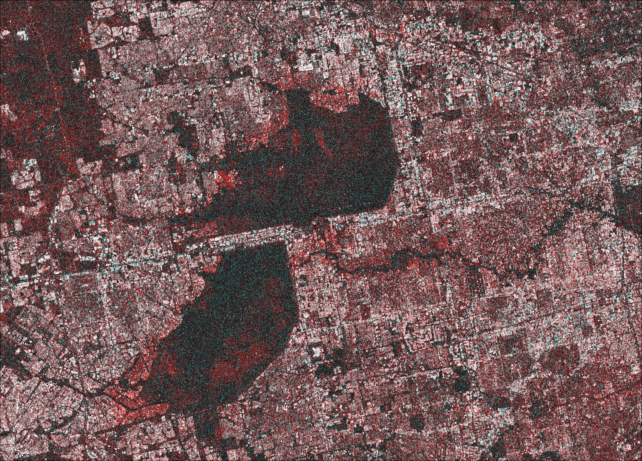

In [436]:
 img_coh = Colors.RGB.(coh[2],coh[1],coh[1])

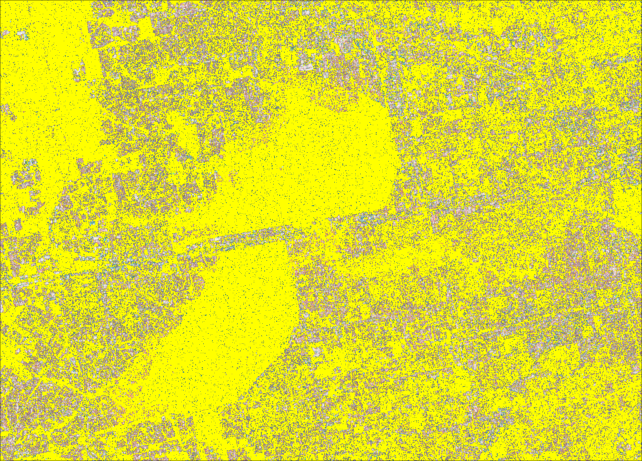

In [437]:
add_mask(img_coh, coh[1] .< 0.4,(1,1,0))

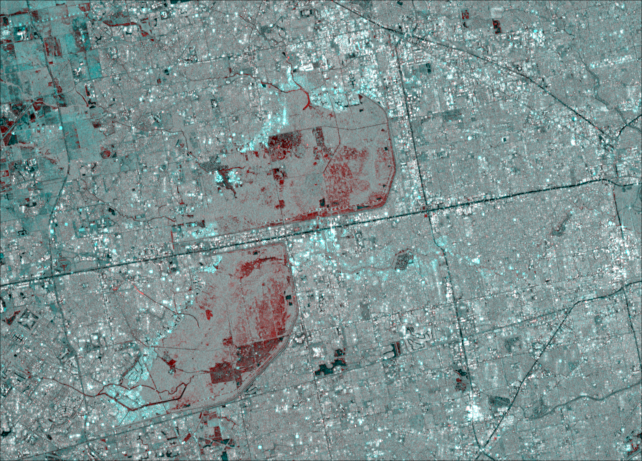

In [438]:
imgVV = pretty_img(VV,min_vv,max_vv)

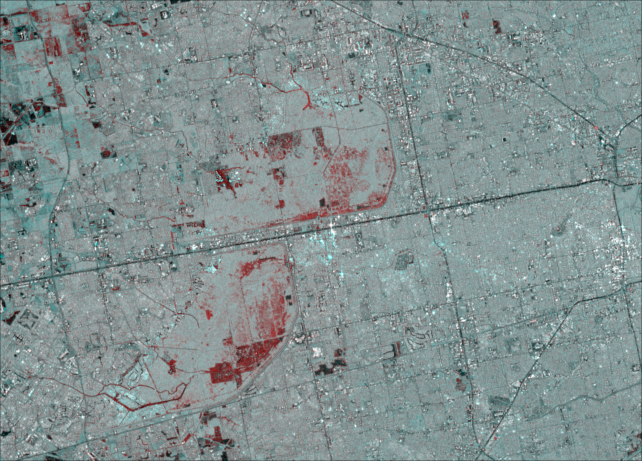

In [439]:
imgVH = pretty_img(VH,min_vh,max_vh)

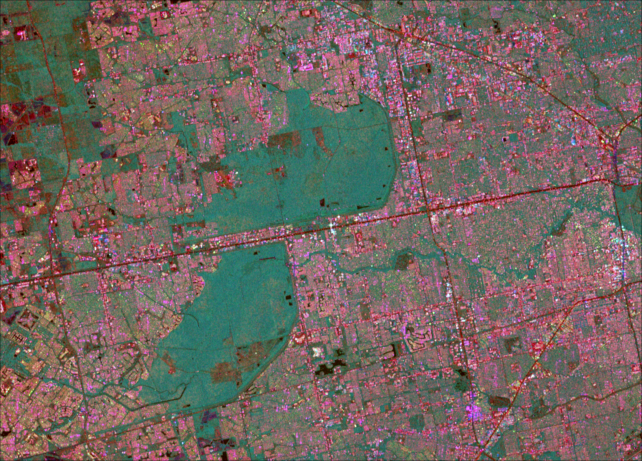

In [440]:
Colors.RGB.(coh[2],db_scale_img(VH[2],min_vh,max_vh),db_scale_img(VV[2],min_vv,max_vv))

## Red points 

In [441]:
## red_pixel 

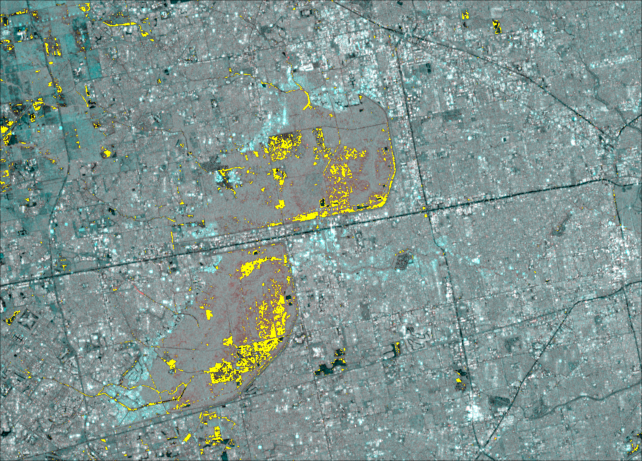

In [442]:
add_mask(imgVV,(delta_VV.<-2) .& (VV_db[1] .< -14),(1,1,0))

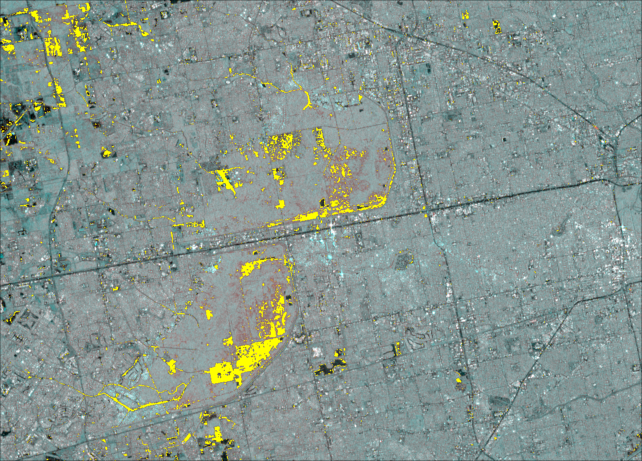

In [443]:
add_mask(imgVH,(delta_VH.<-2) .& (VH_db[1] .< -20) ,(1,1,0))

In [444]:
sure_red = ((delta_VV.<-2) .& (VV_db[1] .< -10)) .& ((delta_VH.<-2) .& (VH_db[1] .< -15));

In [445]:
sure_red = ((delta_VV.<-2) .& (VV_db[1] .< -3)) .& ((delta_VH.<-2) .& (VH_db[1] .< -7));

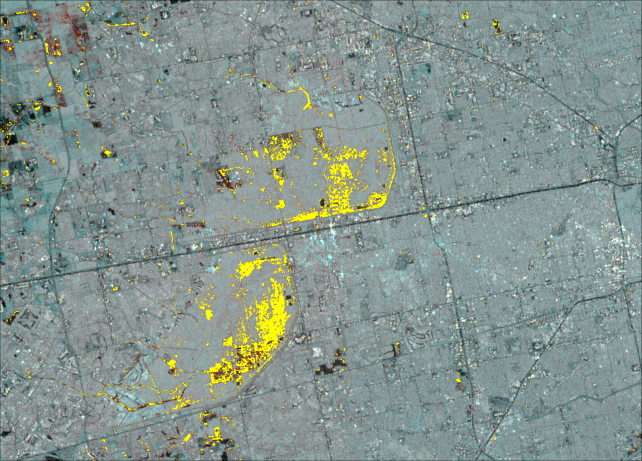

In [446]:
add_mask(imgVH,sure_red ,(1,1,0))

In [447]:
rand_array = Random.randperm(Random.MersenneTwister(124), length(VV_db[1]));

In [448]:
suf_temp = Random.randperm(Random.MersenneTwister(124), sum(sure_red))

sure_red_VV = VV_db[1][sure_red][suf_temp]
sure_red_VH = VH_db[1][sure_red][suf_temp]
sure_red_dVV = delta_VV[sure_red][suf_temp]
sure_red_dVH = delta_VH[sure_red][suf_temp];

In [449]:
maximum(sure_red_VV)

-3.031990002247336

## Multi gauss test 

In [450]:
mu_flood = [Statistics.mean(sure_red_VV),Statistics.mean(sure_red_VH)]


2-element Array{Float64,1}:
 -14.878653297219117
 -20.97631681396009 

In [451]:
sigma_flood = Statistics.cov(cat(sure_red_VV,sure_red_VH, dims=2), dims=1)

2×2 Array{Float64,2}:
 5.89851  4.85242
 4.85242  5.99767

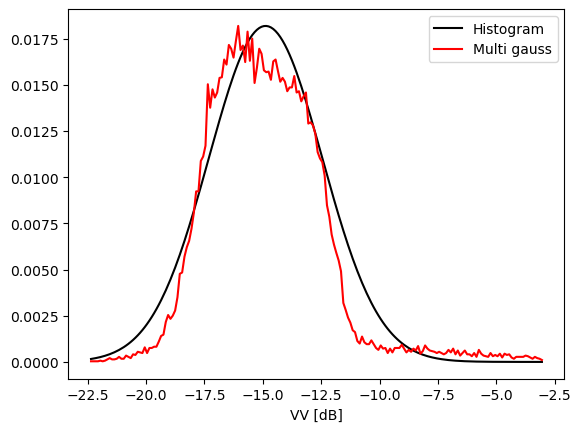

PyObject <matplotlib.legend.Legend object at 0x7fb5233d44f0>

In [452]:
p_fit,y,w,edges, w_sum = fit_bimodal_gauss(sure_red_VV ,round(Int64,length(train_VV)/100))

#file_path = joinpath(figure_folder,"VV_histogram_tiles.png")
PyPlot.figure()
PyPlot.plot(y,gauss_model(y,[maximum(w),mu_flood[1],sqrt(sigma_flood[1,1])]),color="k")

PyPlot.plot(y,w,color="r")
PyPlot.xlabel("VV [dB]")
PyPlot.legend(["Histogram","Multi gauss"])

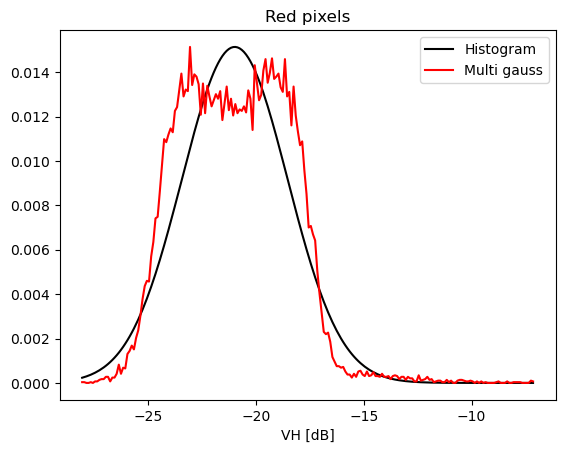

PyObject <matplotlib.legend.Legend object at 0x7fb523339d00>

In [453]:
p_fit,y,w,edges, w_sum = fit_bimodal_gauss(sure_red_VH ,round(Int64,length(train_VH)/100))

PyPlot.figure()
PyPlot.plot(y,gauss_model(y,[maximum(w),mu_flood[2],sqrt(sigma_flood[2,2])]),color="k")

PyPlot.plot(y,w,color="r")
PyPlot.xlabel("VH [dB]")
PyPlot.title("Red pixels")
PyPlot.legend(["Histogram","Multi gauss"])

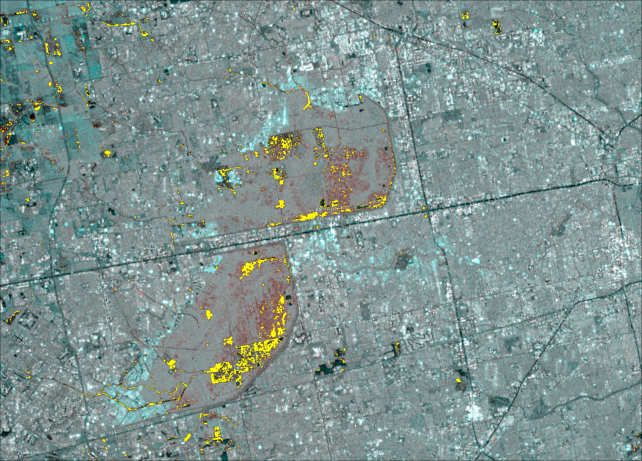

In [454]:
seed_mask = (delta_VV.<-2) .& (VV_db[1] .< mu_flood[1]) .& (delta_VH.<-2) .& (VH_db[1] .< mu_flood[2]);
add_mask(imgVV,seed_mask ,(1,1,0))

In [455]:
rg_mask_change = ((delta_VV.<-2) .& (delta_VH.<0)) .| 
                ((delta_VV.<0) .& (delta_VH.<-2)) .| ( ( (delta_VV .+2).^2 .+ (delta_VH .+2).^2) .< 4 ); 

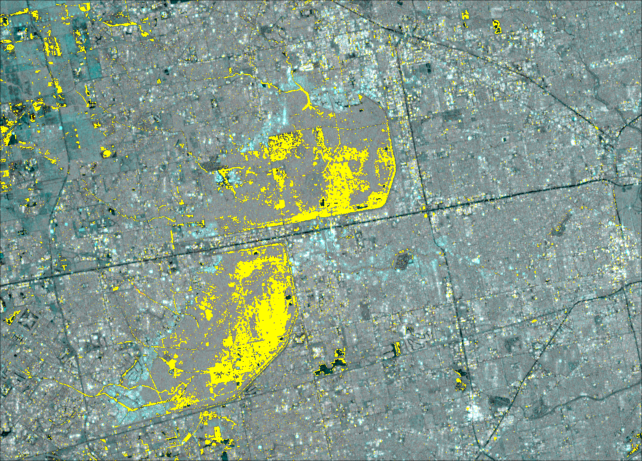

In [456]:
add_mask(imgVV,rg_mask_change ,(1,1,0))

In [457]:
malhob = cat(vec(VV_db[1]) .- mu_flood[1],vec(VH_db[1]).- mu_flood[2],dims=2)
inv_sigma = sigma_flood^-1;
malhob = [transpose(malhob[i,:])*inv_sigma*(malhob[i,:]) for i in 1:length(VV_db[1])];
malhob = reshape(malhob,size(VV_db[1]));

In [458]:
rg_mask_int = ((VV_db[1] .< mu_flood[1]) .& (VH_db[1] .< mu_flood[2])) .| (malhob .< 4)
#.| ((delta_VV.<0) .& (delta_VH.<-2)) .| ( ( (delta_VV .+2).^2 .+ (delta_VH .+2).^2) .< 4 ); 

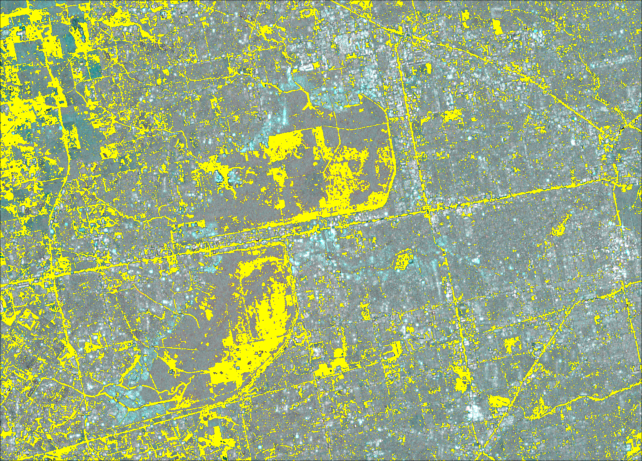

In [459]:
add_mask(imgVV,rg_mask_int ,(1,1,0))

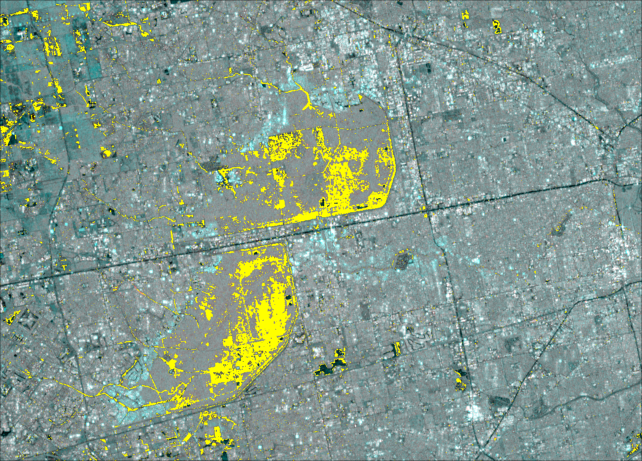

In [460]:
add_mask(imgVV,rg_mask_int .& rg_mask_change,(1,1,0))

In [461]:
flood_test,steps = region_growing(seed_mask,rg_mask_int .& rg_mask_change) ;

In [462]:
steps

46

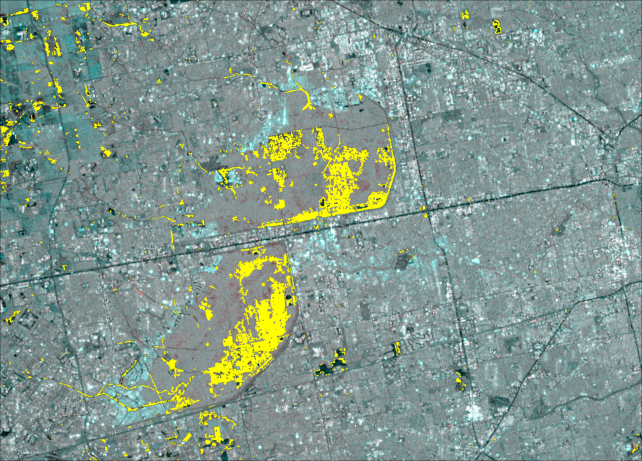

In [463]:
add_mask(imgVV,flood_test,(1,1,0))

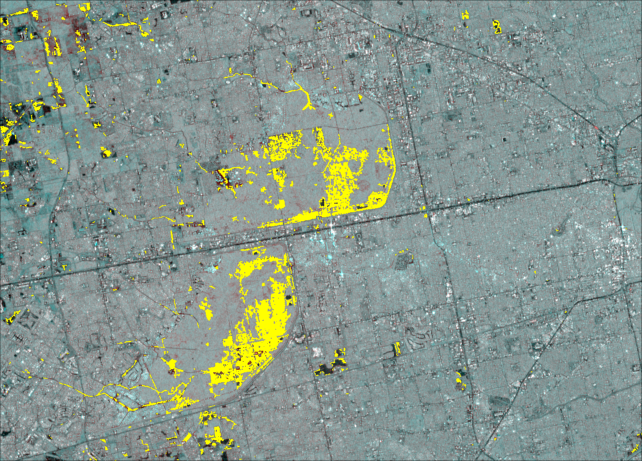

In [464]:
add_mask(imgVH,flood_test,(1,1,0))

# Cyan Pixels

In [513]:
sure_cyan = (delta_VV.>5) .& (coh[2].> 0.5) .&  (delta_coh.< -0.2);

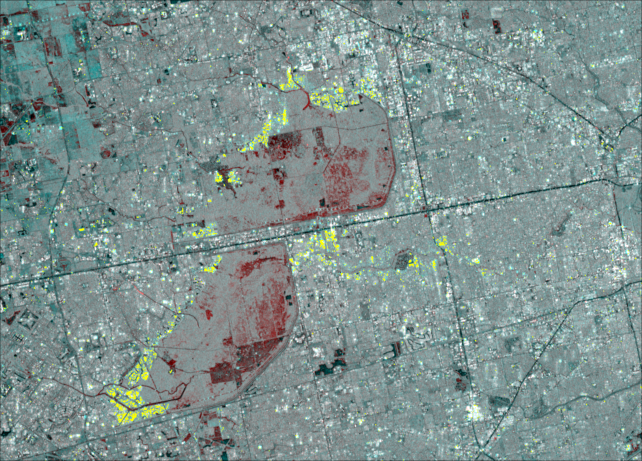

In [514]:
add_mask(imgVV,sure_cyan,(1,1,0))

In [515]:
suf_temp = Random.randperm(Random.MersenneTwister(124), sum(sure_cyan))

sure_cyan_VV = VV_db[1][sure_cyan][suf_temp]
sure_cyan_VH = VH_db[1][sure_cyan][suf_temp]
sure_cyan_dVV = delta_VV[sure_cyan][suf_temp]
sure_cyan_dVH = delta_VH[sure_cyan][suf_temp];

In [516]:
sum(sure_cyan)

11009

In [517]:
mu_flood = [Statistics.mean(sure_cyan_VV),Statistics.mean(sure_cyan_VH)]


2-element Array{Float64,1}:
  -1.7666233333586443
 -12.530336042727837 

In [518]:
sigma_flood = Statistics.cov(cat(sure_cyan_VV,sure_cyan_VH, dims=2), dims=1)

2×2 Array{Float64,2}:
 17.0062  10.0613
 10.0613  17.7339

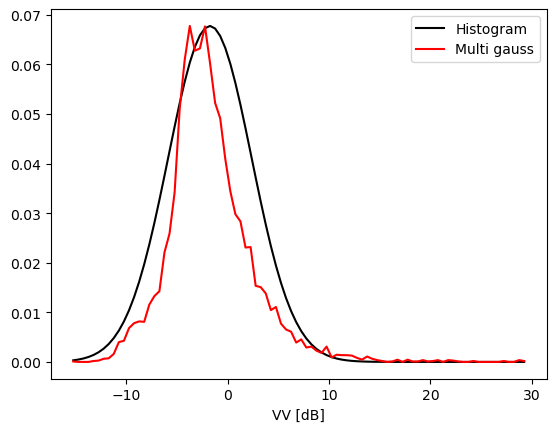

PyObject <matplotlib.legend.Legend object at 0x7fb5232916a0>

In [519]:
p_fit,y,w,edges, w_sum = fit_bimodal_gauss(sure_cyan_VV ,round(Int64,length(sure_cyan_VV)/100))

#file_path = joinpath(figure_folder,"VV_histogram_tiles.png")
PyPlot.figure()
PyPlot.plot(y,gauss_model(y,[maximum(w),mu_flood[1],sqrt(sigma_flood[1,1])]),color="k")

PyPlot.plot(y,w,color="r")
PyPlot.xlabel("VV [dB]")
PyPlot.legend(["Histogram","Multi gauss"])

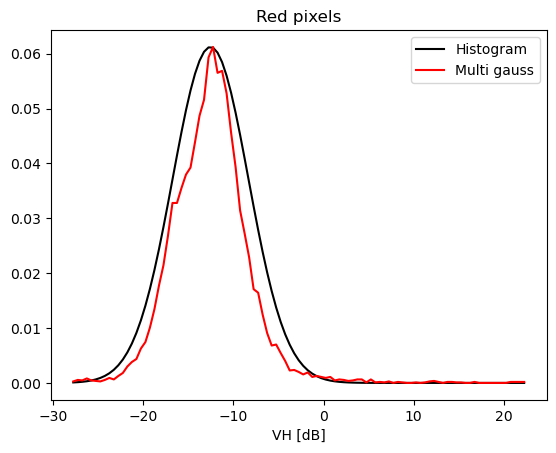

PyObject <matplotlib.legend.Legend object at 0x7fb523a78670>

In [520]:
p_fit,y,w,edges, w_sum = fit_bimodal_gauss(sure_cyan_VH ,round(Int64,length(sure_cyan_VH)/100))

PyPlot.figure()
PyPlot.plot(y,gauss_model(y,[maximum(w),mu_flood[2],sqrt(sigma_flood[2,2])]),color="k")

PyPlot.plot(y,w,color="r")
PyPlot.xlabel("VH [dB]")
PyPlot.title("Red pixels")
PyPlot.legend(["Histogram","Multi gauss"])

In [299]:
semi_red = skimage_morph.binary_dilation(sure_red,ones(3,3)) .& .!sure_red ;
N_semi = sum(semi_red)

28305

In [300]:
suf_temp = Random.randperm(Random.MersenneTwister(124), sum(semi_red))

semi_red_VV = VV_db[1][semi_red][suf_temp]
semi_red_VH = VH_db[1][semi_red][suf_temp]
semi_red_dVV = delta_VV[semi_red][suf_temp]
semi_red_dVH = delta_VH[semi_red][suf_temp];

In [301]:
suf_temp = Random.randperm(Random.MersenneTwister(124), length(VV_db[1]))[1:10^5]

rand_VV = VV_db[1][suf_temp]
rand_VH = VH_db[1][suf_temp]
rand_dVV = delta_VV[suf_temp]
rand_dVH = delta_VH[suf_temp];

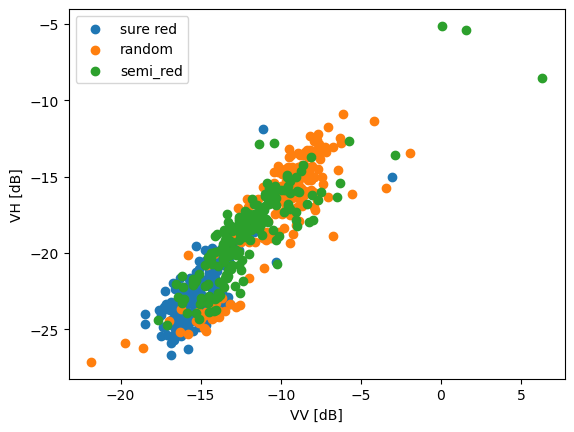

PyObject <matplotlib.legend.Legend object at 0x7fb5239aa610>

In [302]:
PyPlot.figure()
PyPlot.scatter(sure_red_VV[1:200] ,sure_red_VH[1:200])
PyPlot.scatter(rand_VV[1:200] ,rand_VH[1:200])
PyPlot.scatter(semi_red_VV[1:200] ,semi_red_VH[1:200])

PyPlot.xlabel("VV [dB]")
PyPlot.ylabel("VH [dB]")
PyPlot.legend(["sure red","random","semi_red"])

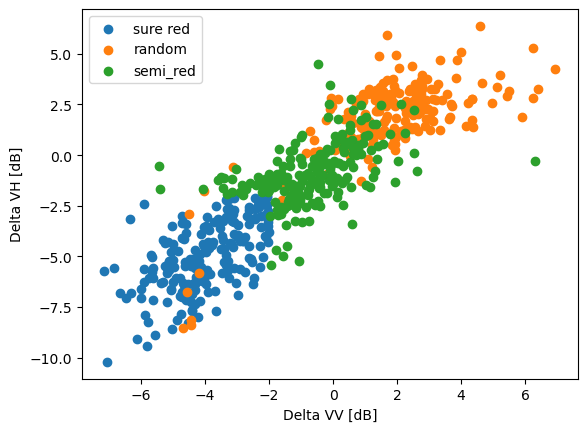

PyObject <matplotlib.legend.Legend object at 0x7fb52387ae20>

In [303]:
PyPlot.figure()
PyPlot.scatter(sure_red_dVV[1:200] ,sure_red_dVH[1:200])
PyPlot.scatter(rand_dVV[1:200] ,rand_dVH[1:200])
PyPlot.scatter(semi_red_dVV[1:200] ,semi_red_dVH[1:200])

PyPlot.xlabel("Delta VV [dB]")
PyPlot.ylabel("Delta VH [dB]")
PyPlot.legend(["sure red","random","semi_red"])

In [304]:
length(sure_red_VV), length(semi_red_VV)

(29877, 28305)

In [305]:
f_semi = 0
f_rand = 0

N_red = length(sure_red_VV)
N_semi =round(Int,N_red *f_semi)
N_rand =round(Int,N_red *f_rand)


train_VV = cat(sure_red_VV,semi_red_VV[1:N_semi],rand_VV[1:N_rand],dims=1)
train_VH = cat(sure_red_VH,semi_red_VH[1:N_semi],rand_VH[1:N_rand],dims=1);

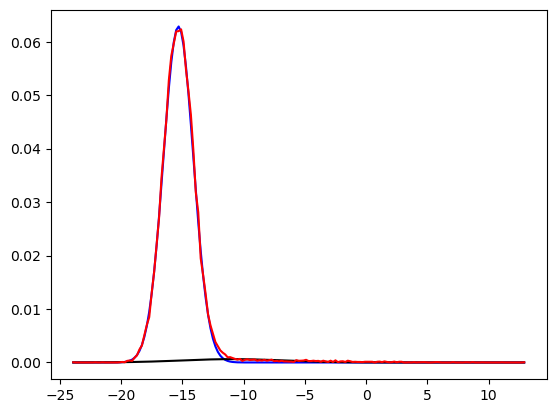

1-element Array{PyCall.PyObject,1}:
 PyObject <matplotlib.lines.Line2D object at 0x7fb519e8f460>

In [103]:
p_fit,y,w,edges, w_sum = fit_bimodal_gauss(train_VV ,round(Int64,length(train_VV)/100))

#file_path = joinpath(figure_folder,"VV_histogram_tiles.png")
PyPlot.figure()

PyPlot.plot(y,gauss_model(y,p_fit[[1,3,5]]),color="b")
PyPlot.plot(y,gauss_model(y,p_fit[[2,4,6]]),color="k")
PyPlot.plot(y,w,color="r")

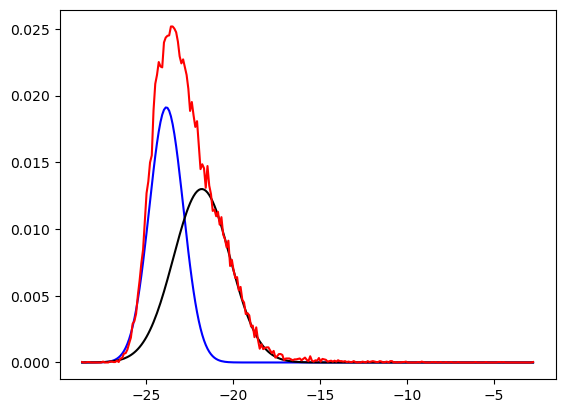

1-element Array{PyCall.PyObject,1}:
 PyObject <matplotlib.lines.Line2D object at 0x7fb519de6f10>

In [104]:
p_fit,y,w,edges, w_sum = fit_bimodal_gauss(train_VH ,round(Int64,length(train_VH)/100))

#file_path = joinpath(figure_folder,"VV_histogram_tiles.png")
PyPlot.figure()

PyPlot.plot(y,gauss_model(y,p_fit[[1,3,5]]),color="b")
PyPlot.plot(y,w,color="r")

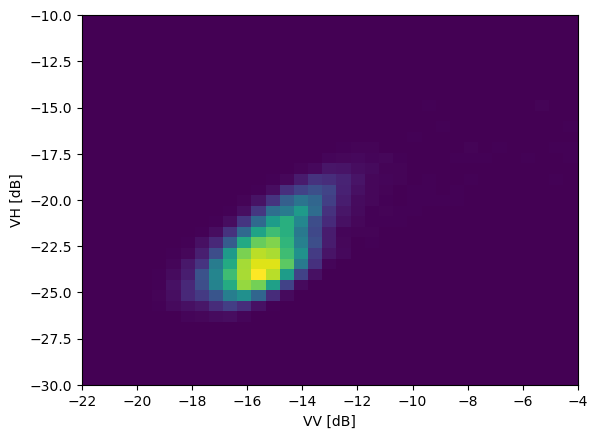

PyObject Text(24.0, 0.5, 'VH [dB]')

In [105]:
fig, axes = PyPlot.subplots()
axes.hist2d(train_VV ,train_VH,bins=35,range=[[-22,-4],[-30,-10]]);

PyPlot.xlabel("VV [dB]")
PyPlot.ylabel("VH [dB]")

In [106]:


train_dVV = cat(sure_red_dVV,semi_red_dVV[1:N_semi],rand_dVV[1:N_rand],dims=1)
train_dVH = cat(sure_red_dVH,semi_red_dVH[1:N_semi],rand_dVH[1:N_rand],dims=1);

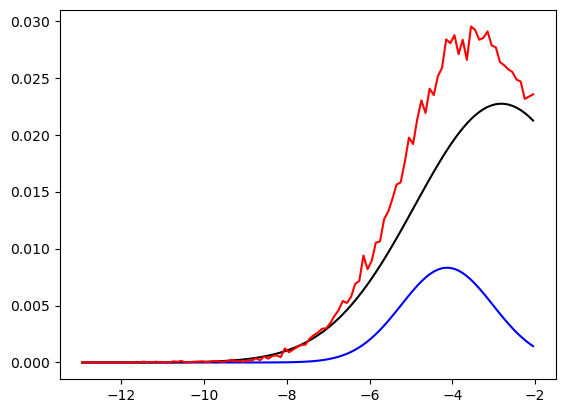

1-element Array{PyCall.PyObject,1}:
 PyObject <matplotlib.lines.Line2D object at 0x7fb519c7cee0>

In [110]:
p_fit,y,w,edges, w_sum = fit_bimodal_gauss(train_dVV ,round(Int64,length(train_dVV)/200))

#file_path = joinpath(figure_folder,"VV_histogram_tiles.png")
PyPlot.figure()

PyPlot.plot(y,gauss_model(y,p_fit[[1,3,5]]),color="b")
PyPlot.plot(y,gauss_model(y,p_fit[[2,4,6]]),color="k")
PyPlot.plot(y,w,color="r")

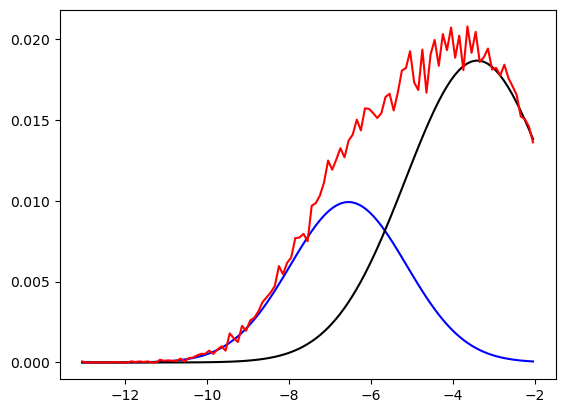

1-element Array{PyCall.PyObject,1}:
 PyObject <matplotlib.lines.Line2D object at 0x7fb519bdaf70>

In [111]:
p_fit,y,w,edges, w_sum = fit_bimodal_gauss(train_dVH ,round(Int64,length(train_dVH)/200))

#file_path = joinpath(figure_folder,"VV_histogram_tiles.png")
PyPlot.figure()

PyPlot.plot(y,gauss_model(y,p_fit[[1,3,5]]),color="b")
PyPlot.plot(y,gauss_model(y,p_fit[[2,4,6]]),color="k")
PyPlot.plot(y,w,color="r")

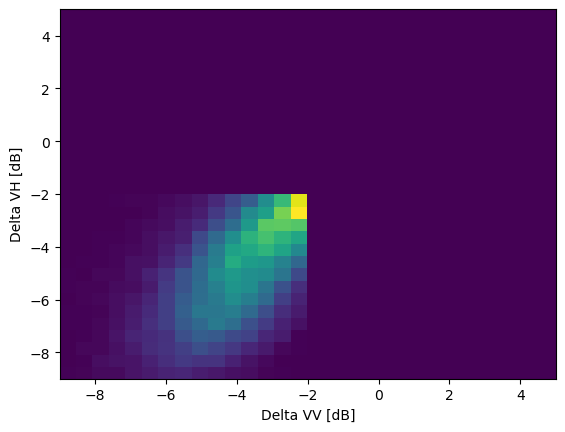

PyObject Text(24.000000000000007, 0.5, 'Delta VH [dB]')

In [109]:
fig, axes = PyPlot.subplots()
axes.hist2d(train_dVV ,train_dVH,bins=30,range=[[-9,5],[-9,5]]);

PyPlot.xlabel("Delta VV [dB]")
PyPlot.ylabel("Delta VH [dB]")

In [ ]:
add_mask